# Introduction

In this tutorial, we cover training, loading, and query of the scShift model. Note that we refer its backbone variational inference model (and the package name) as PertVI.

# 0. Loading packages

In [1]:
import scanpy as sc
import squidpy as sq

import numpy as np
import pandas as pd

In [2]:
from pertvi.model import PertVI

Global seed set to 0


# 1. Training a model

As training a model takes rather long time, we omit real training by setting the epoch number to 0 in this tutorial.

In [ ]:
adata = sc.read_h5ad('train_blood.h5ad')
PertVI.get_pert(adata,drug_label='sm_name',dose_label ='dose_uM', ct_drug='Dimethyl Sulfoxide')
PertVI.setup_anndata(adata, batch_key='assay',labels_key = 'sm_name')

In [ ]:
model_test = PertVI(adata,n_layers=2,n_latent=100,n_hidden=1000,lam_l0=0.2,lam_l1=1e-4,kl_weight=0.5,lam_corr=1.5,use_observed_lib_size=True)
model_test.train(
    train_size=0.9,
    use_gpu=3, # needs to be adjusted base on your own device
    batch_size=400,
    early_stopping=False,
    max_epochs=0,
    lr = 1e-3,
    weight_decay = 1e-5,
    n_samples_per_label = 2,
)

# 2. Loading a pretrained model

In [3]:
adata = sc.read_h5ad('train_blood.h5ad')
PertVI.get_pert(adata,drug_label='sm_name',dose_label ='dose_uM', ct_drug='Dimethyl Sulfoxide')
model = PertVI.load('blood_02_100', adata)

/app/MetaVI_project/pertvi/model/pertvi.py:327: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  df = df * adata.obs[dose_label][:,None]


INFO     File trained_models/blood_02_100/model.pt already downloaded                                              


No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


Next we identify the batch and biological components returned by the model. Note here the first 1000000 cells in the adata corresponds to the scRNA-seq blood atlas dataset, and the other cells correspond to the perturbation dataset. Therefore, we define a and b as follows, which represents the biological and batch labels respectively.

In [4]:
adata.obsm['pert_embedding'] = model.get_latent_representation(adata,representation_kind='pert')
a = (adata[1000000:-1].obsm['pert_embedding']!=0).sum(axis=0).copy()
b = (adata[0:1000000].obsm['pert_embedding']!=0).sum(axis=0).copy()
(a+b>0).sum()

28

In [5]:
adata.obsm['base_embedding'] = model.get_latent_representation(adata,representation_kind='base')
adata.obsm['base_ct'] = adata.obsm['base_embedding'][:,(a+b)==0]
adata.obsm['base_pert'] = adata.obsm['base_embedding'][:,a!=0]
adata.obsm['base_ct'].shape

(1240090, 72)

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


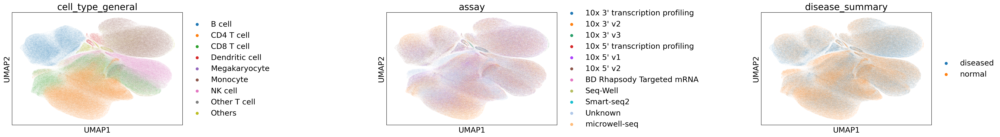

In [9]:
adata.obs = pd.read_csv('blood_obsdf.csv',index_col=0)
sc.pp.neighbors(adata,use_rep='base_ct')
sc.tl.umap(adata)

sc.pl.umap(adata,color=['cell_type_general','assay','disease_summary'],wspace=1)

# 3. zero-shot query

Here we load a preprocessed version of the interferon stimulation dataset and reproduce the scShift visualization results shown in Fig. 3 of our manuscript.

In [11]:
adata_query = sc.read_h5ad('interferon_benchmark.h5ad')
adata_query.obs['sm_name'] = 'Dimethyl Sulfoxide'
adata_query.obs['assay'] = "Unknown"
adata_query.obs_names_make_unique()
adata_query.var_names_make_unique()
model.prepare_query_anndata(adata_query,model)
adata_query.obsm['pert'] = np.zeros((adata_query.shape[0],model.module.n_pert))
adata_query.obsm['base_embedding'] = model.get_latent_representation(adata_query,representation_kind='base')

INFO     Found 100.0% reference vars in query data.                                                                
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


In [12]:
adata_query.obsm['base_pert'] = adata_query.obsm['base_embedding'][:,a!=0]
adata_query.obsm['base_ct'] = adata_query.obsm['base_embedding'][:,(a+b)==0]

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


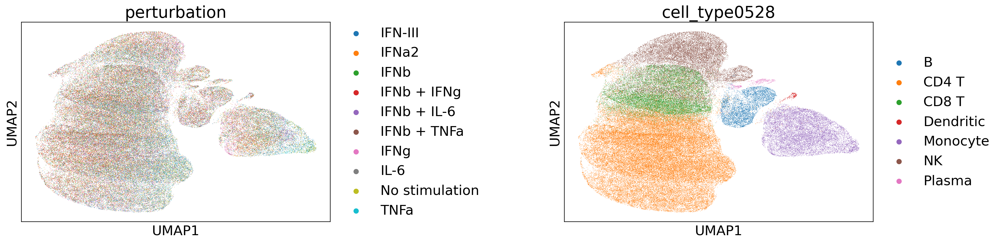

In [13]:
sc.pp.neighbors(adata_query,use_rep='base_ct')
sc.tl.umap(adata_query)
sc.pl.umap(adata_query,color=['perturbation','cell_type0528'],wspace=0.6)

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


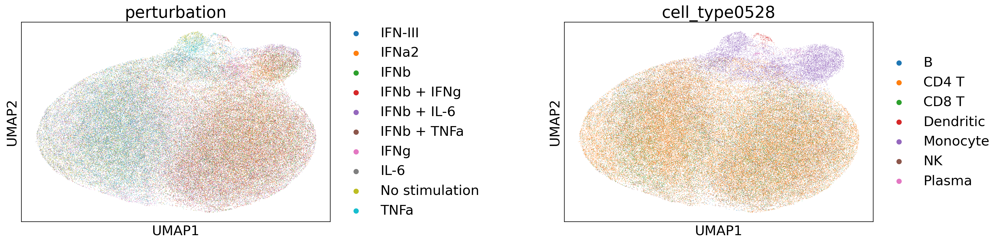

In [14]:
sc.pp.neighbors(adata_query,use_rep='base_pert')
sc.tl.umap(adata_query)
sc.pl.umap(adata_query,color=['perturbation','cell_type0528'],wspace=0.6)